Nick Clifford

# Term Frequency Inverse Document Frequency (TFIDF)

# Setup

In [204]:
import time
import pandas as pd
import plotly_express as px

In [214]:
OHCO = 'author year doc_id page_num para_num sent_num token_num'.split()

datadir = '/Users/nickclifford/Documents/UVA/Spring 2020/DS 5001 Exploratory Text Analysis/final/data/'
table_out = datadir + 'tables/'

LIB = pd.read_csv(datadir + 'tables/LIB_mod.csv', parse_dates=['date']).set_index('doc_id')
TOKEN = pd.read_csv(datadir + 'tables/TOKEN_mod.csv').set_index('doc_id')
VOCAB = pd.read_csv(datadir + 'tables/VOCAB_mod.csv').set_index('term_id')

# Generate `TFIDF` Table

Here I define a function for generating a TFIDF table and Document term count matrix (DTM) to aid in many generations of TFIDF tables based on different bagging/OHCO specifcations

In [226]:
def get_TFIDF(TOKEN, VOCAB, LIB, OHCO=OHCO, bagging='doc_id', tf_method='sum', idf_method='standard', item='term_id'):
    """From TOKEN table and specified methods and OHCO bagging,
    creates a TFIDF table along with respective DTCM tables"""
    
    # add author/county/date col to token
    TOKEN = TOKEN.merge(LIB[['author', 'county', 'date']], left_index=True, right_index=True).reset_index()
    # add stem col to token
    TOKEN['year'] = TOKEN.date.dt.year
    TOKEN['month'] = TOKEN.date.dt.month
    TOKEN['stem_porter'] = TOKEN.term_id.map(VOCAB.stem_porter)
    
    bag = OHCO[:OHCO.index(bagging) + 1]
    
    if item == 'term_str':
        BOW = TOKEN.groupby(bag+['term_str']).term_str.count()\
        .to_frame().rename(columns={'term_str':'n'})
    elif item == 'term_id':
        BOW = TOKEN.groupby(bag+['term_id']).term_id.count()\
        .to_frame().rename(columns={'term_id':'n'})
    elif item == 'stem':
        BOW = TOKEN.groupby(bag+['stem_porter']).stem_porter.count()\
        .to_frame().rename(columns={'stem_porter':'n'})
        
    BOW['c'] = BOW.n.astype('bool').astype('int')
    DTCM = BOW['n'].unstack().fillna(0).astype('int')
    
    
    if tf_method == 'sum':
        TF = DTCM.T / DTCM.T.sum()

    elif tf_method == 'max':
        TF = DTCM.T / DTCM.T.max()

    elif tf_method == 'log':
        TF = np.log10(1 + DTCM.T)

    elif tf_method == 'raw':
        TF = DTCM.T

    elif tf_method == 'double_norm':
        TF = DTCM.T / DTCM.T.max()
        TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0] # EXPLAIN; may defeat purpose of norming

    elif tf_method == 'binary':
        TF = DTCM.T.astype('bool').astype('int')
    
    TF = TF.T
    DF = DTCM[DTCM > 0].count()
    N = DTCM.shape[0]
    
    if idf_method == 'standard':
        IDF = np.log10(N / DF)

    elif idf_method == 'max':
        IDF = np.log10(DF.max() / DF) 

    elif idf_method == 'smooth':
        IDF = np.log10((1 + N) / (1 + DF)) + 1 # Correct?

    TFIDF = TF * IDF
    
    return TFIDF, DTCM

In [180]:
OHCO = 'author year doc_id page_num para_num sent_num token_num'.split()
TFIDF_yr, DTCM_yr = get_TFIDF(TOKEN, VOCAB, LIB, bagging = 'year')

VOCAB.term_str.reset_index()\
.merge(TFIDF_yr.sum().reset_index().rename({0:'tfidf_sum'}, axis=1)).iloc[:,1:].set_index('term_str')\
.sort_values('tfidf_sum', ascending=False)[0:10]

,tfidf_sum
term_str,
we,0.794775
he,0.794553
sir,0.707560
respectfully,0.634952
w,0.594885
was,0.579984
him,0.577760
our,0.577555
nt,0.564842


In [181]:
OHCO = 'author year doc_id page_num para_num sent_num token_num'.split()
TFIDF_a, DTCM_a = get_TFIDF(TOKEN, VOCAB, LIB, bagging = 'author')

VOCAB.term_str.reset_index()\
.merge(TFIDF_a.sum().reset_index().rename({0:'tfidf_sum'}, axis=1)).iloc[:,1:].set_index('term_str')\
.sort_values('tfidf_sum', ascending=False)[0:10]

,tfidf_sum
term_str,
we,0.608358
he,0.568587
sir,0.523545
w,0.522604
respectfully,0.502450
was,0.444579
i,0.443022
our,0.422889
him,0.418420


In [223]:
OHCO = 'doc_id page_num para_num sent_num token_num'.split()
TFIDF_pg, DTCM_pg = get_TFIDF(TOKEN, VOCAB, LIB, bagging = 'page_num')

VOCAB.term_str.reset_index()\
.merge(TFIDF_doc.sum().reset_index().rename({0:'tfidf_sum'}, axis=1)).iloc[:,1:].set_index('term_str')\
.sort_values('tfidf_sum', ascending=False)[0:10]

,tfidf_sum
term_str,
dear,620.144422
yours,405.055900
sir,280.793792
staunton,242.485905
your,235.670165
my,204.652041
jed,182.977708
respectfully,179.543602
the,179.323783


# Visualize Significant words

By looking at the total word-context entropy of a word vs its ranking in term frequency, we can examine the more 'significant' words, which are located along the horizontal peak.

In [179]:
def plot_sig(VOCAB, DTCM, title):
    """Plot X-factor vs Term Rank"""
    
    # Word-Context Matrix Entropy
    WCM = DTCM / DTCM.sum()
    WCMh = WCM * np.log2(1/WCM)
    VOCAB['h2'] = WCMh.sum()
    # x factor
    VOCAB['x_factor'] = np.log(VOCAB.term_rank) * VOCAB.h2

    return px.scatter(VOCAB, 
                      x='term_rank', 
                      y='x_factor', 
                      hover_name='term_str',
                      color='pos_max', 
                      hover_data=['n'],
                      title=title)

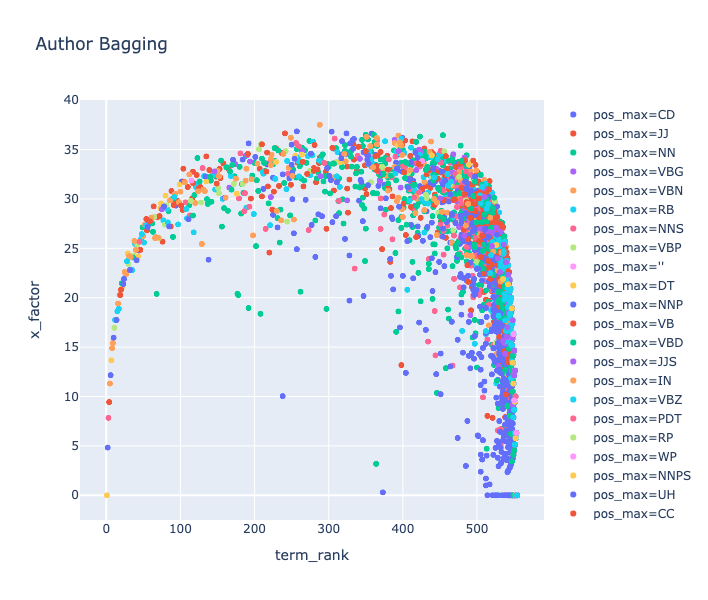

In [196]:
plot_sig(VOCAB, DTCM_a, 'Author Bagging')

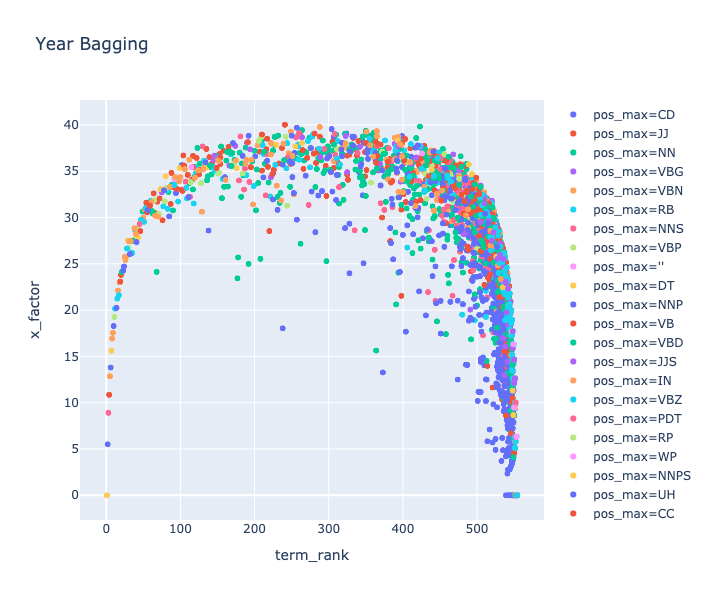

In [193]:
plot_sig(VOCAB, DTCM_yr, 'Year Bagging')

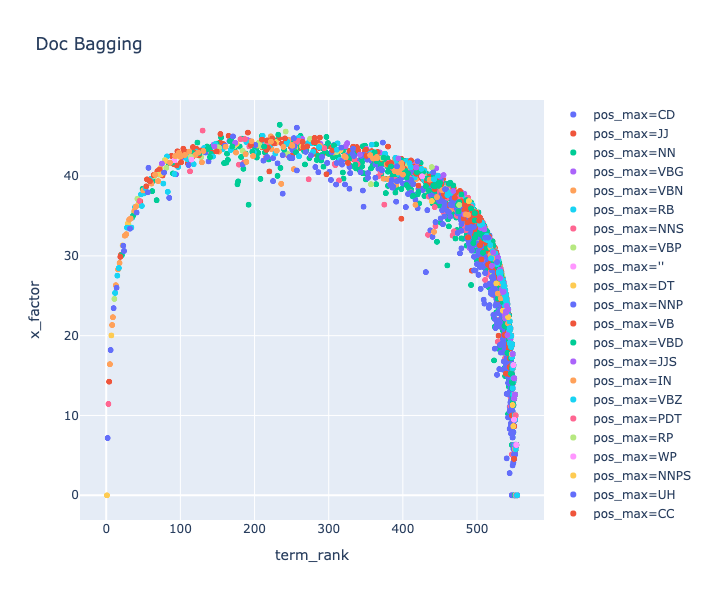

In [192]:
plot_sig(VOCAB, DTCM_doc, 'Doc Bagging')

# Annotate `VOCAB`

## Word-Context Matrix Entropy

Use author bagging resulting DTCM and add new entropy to `VOCAB` table.

In [206]:
WCM = DTCM_a / DTCM_a.sum()

In [207]:
WCMh = WCM * np.log2(1/WCM)

In [208]:
VOCAB['h2'] = WCMh.sum()

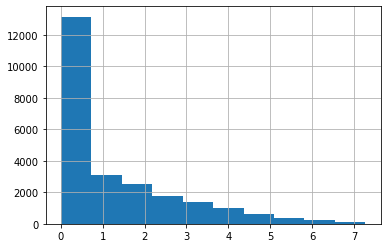

In [200]:
VOCAB['h2'].hist();

## X Factor

Use WCM entropy and add x-factor to `VOCAB` table.

In [209]:
VOCAB['x_factor'] = np.log(VOCAB.term_rank) * VOCAB.h2

# Conclusions

From inspection of the X-factor vs. Term rank plots, bagging at the highest level (author) allows for the best separation between pronouns/nouns and all other significant words. This would make sense as there are many different documents in the corpus, all of which are much shorter in length than the average novel. While not all authors are reoccuring, bagging at this level would drop out more of the less common pronouns.

However, I would argue that the inverse amount of documents vs. available text for these letters compared to something like an author's collection of novels (fewer documents, greater texts), makes this approach less effective. Perhaps if I filtered out all letters not written by reoccuring authors then I could better filter out pronouns from significant words, but at the moment, 40% of documents are from one-time authors, so most of the uncommon pronouns drop out from low-rank.

Looking at this plot, the significant words as a whole sound like words necessary for people writing letters back in the day as their only form of communication. Whether people were asking for loved ones to return home with supplies (send, brother, love), or were informing them about events related to the war (wounded, sickness, battle, furlough), most of these historical figures seem to speak to the point and with little use of imagery words. 

# Import Tables to `.CSV`

In [224]:
%%time
OHCO = 'doc_id page_num para_num sent_num token_num'.split()

TFIDF, DTCM = get_TFIDF(TOKEN, VOCAB, LIB, bagging = 'page_num')

Get bag of words

In [ ]:
bag = 'doc_id page_num'.split()

BOW = TOKEN.groupby(bag+['term_str']).term_str.count()\
        .to_frame().rename(columns={'term_str':'n'})
BOW['c'] = BOW.n.astype('bool').astype('int')

In [ ]:
BOW.head()

In [225]:
TFIDF.to_csv(table_out + 'TFIDF_mod.csv')
DTCM.to_csv(table_out + 'DTCM_mod.csv')
VOCAB.to_csv(table_out + 'VOCAB2_mod.csv')